In [11]:
import warnings
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", RuntimeWarning)

import sys
sys.path.append('../../dstorch/')

import pandas as pd
import seaborn
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [ ]:
from dstorch import io, dataset, transforms, losses, models, predict, draw, utils
from dstorch.train import train
from dstorch.utils import variable
import torch.backends.cudnn as cudnn
import torch
import torch.nn as nn
from torch.optim import Adam
from tqdm import tqdm_notebook
import numpy as np

In [3]:
TRAIN_PATH = '../../../dsbowl/kaggle-dsbowl-2018-dataset-fixes/stage1_train/'
TEST_PATH = '../../../dsbowl/stage1_test/'

ids, images, masks = io.read_train_data(TRAIN_PATH, d=3)
test_ids, test_images = io.read_test_data(TEST_PATH, d=3)

HBox(children=(IntProgress(value=0, description='Reading train data..', max=664), HTML(value='')))

HBox(children=(IntProgress(value=0, description='Reading test data..', max=65), HTML(value='')))

In [4]:
classes = pd.read_csv("../../../dsbowl/classes.csv")

images = utils.invert_images(classes, images, ids)
test_images = utils.invert_images(classes, test_images, test_ids)

In [5]:
rles = pd.read_csv("../../../dsbowl/stage1_train_labels/stage1_train_labels.csv")
labels = utils.rles2labels(rles, [x.shape for x in masks], ids)

HBox(children=(IntProgress(value=0, max=664), HTML(value='')))

In [6]:
train_args, val_args = utils.train_val_split(classes, ids, images, masks, ids, labels)
train_images, train_masks, train_ids, train_labels = train_args
val_images, val_masks, val_ids, val_labels = val_args

Количество изображений в трейне: 597
Количество изображений в валидации: 67
Границы значений: images [11, 216], masks [0.0, 1.0], labels [0, 17]


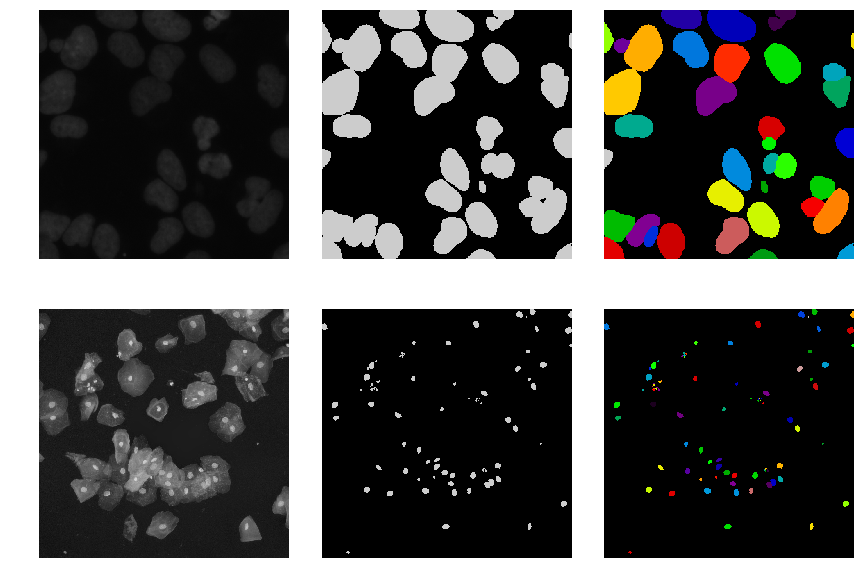

In [7]:
print('Количество изображений в трейне: {}'.format(len(train_images)))
print('Количество изображений в валидации: {}'.format(len(val_images)))
print('Границы значений: images [{}, {}], masks [{}, {}], labels [{}, {}]'.format(
    train_images[1].min(),
    train_images[1].max(),
    train_masks[1].min(),
    train_masks[1].max(),
    train_labels[1].min(),
    train_labels[1].max()
))

draw.plots([
    train_images[10], train_masks[10], train_labels[10],
    val_images[10], val_masks[10], val_labels[10],
], col_number=3, scale=4)

In [8]:
train_transform = transforms.DualCompose(
    [
        transforms.RandomCrop((256, 256)),
        transforms.VerticalFlip(),
        transforms.HorizontalFlip(),
        transforms.Transpose(),
        transforms.ShiftScaleRotate(),
        transforms.ImageOnly(transforms.RandomHueSaturationValue()),
        transforms.ImageOnly(transforms.RandomBrightness()),
        transforms.ImageOnly(transforms.RandomContrast()),
        transforms.ImageOnly(transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        ))
    ]
)

val_transform = transforms.DualCompose(
    [
        transforms.ImageOnly(transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]))
    ]
)

train_loader = dataset.make_loader(
    train_images, train_masks, train_ids, 16, transform=train_transform, period=64
)

val_loader = dataset.make_loader(
    val_images, val_masks, val_ids, 1, transform=val_transform, shuffle=False, mode='validation', period=64
)

In [13]:
model = models.TernausNet34(num_classes=1, num_filters=16, pretrained=True)
loss = losses.BCEDiceLoss()

if torch.cuda.is_available():
    model = nn.DataParallel(model).cuda()    
    cudnn.benchmark = True

In [14]:
train(
    init_optimizer=lambda lr: Adam(model.parameters(), lr=lr),
    model=model,
    criterion=loss,
    train_loader=train_loader,
    val_loader=val_loader,
    n_epochs=50, 
    batch_size=16,
    lr=0.0001
)

HBox(children=(IntProgress(value=0, max=608), HTML(value='')))

Process Process-3:
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/usr/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 50, in _worker_loop
    r = index_queue.get()
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 335, in get
    res = self._reader.recv_bytes()
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 216, in recv_bytes
    buf = self._recv_bytes(maxlength)



done.


  File "/usr/lib/python3.6/multiprocessing/connection.py", line 407, in _recv_bytes
    buf = self._recv(4)
KeyboardInterrupt
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 379, in _recv
    chunk = read(handle, remaining)


In [30]:
torch.save({
        'model': model.state_dict(),
        'epoch': 50,
    }, str('best50.pt'))

In [8]:
state = torch.load(str('best50.pt'))

In [9]:
model.load_state_dict(state['model'])

In [34]:
test_transform = transforms.DualCompose(
    [
        transforms.ImageOnly(transforms.Normalize())
    ]
)

val_predictions, val_names = predict.predict(model, val_images, val_ids, test_transform, 1)

HBox(children=(IntProgress(value=0, description='Predict', max=67), HTML(value='')))

In [79]:
import numpy as np
from sklearn.metrics.pairwise import pairwise_distances
from tqdm import tqdm


def decompose(labeled):
    nr_true = labeled.max()
    masks = []
    for i in np.unique(labeled):
        if i:
            msk = labeled.copy()
            msk[msk != i] = 0.
            msk[msk == i] = 255.
            masks.append(msk)

    if not masks:
        return [labeled]
    else:
        return masks

def iou(gt, pred):
    gt[gt > 0] = 1.
    pred[pred > 0] = 1.
    intersection = gt * pred
    union = gt + pred
    union[union > 0] = 1.
    intersection = np.sum(intersection)
    union = np.sum(union)
    if union == 0:
        union = 1e-09
    return intersection / union


def compute_ious(gt, predictions):
    gt_ = decompose(gt)
    predictions_ = decompose(predictions)
    gt_ = np.asarray([el.flatten() for el in gt_])
    predictions_ = np.asarray([el.flatten() for el in predictions_])
    print(gt_.shape, predictions_.shape)
    ious = pairwise_distances(X=gt_, Y=predictions_, metric=iou)
    return ious


def compute_precision_at(ious, threshold):
    mx1 = np.max(ious, axis=0)
    mx2 = np.max(ious, axis=1)
    tp = np.sum(mx2 >= threshold)
    fp = np.sum(mx2 < threshold)
    fn = np.sum(mx1 < threshold)
    return float(tp) / (tp + fp + fn)


def compute_eval_metric(gt, predictions):
    thresholds = [0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95]
    ious = compute_ious(gt, predictions)
    precisions = [compute_precision_at(ious, th) for th in thresholds]
    return sum(precisions) / len(precisions)

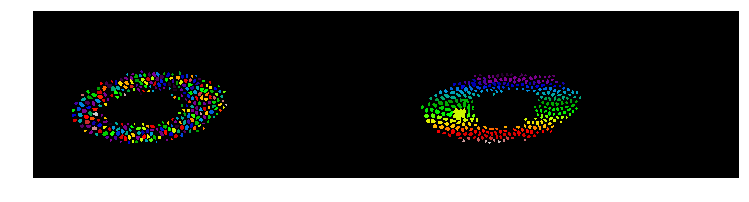

In [81]:
draw.plots([val_labels[i], answer])

0.8119047619047619 0.8119047619047619


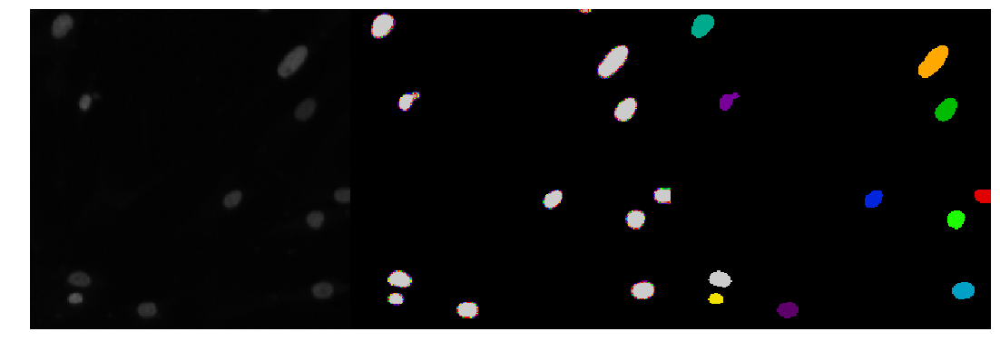

0.7771545031055899 0.7945296325051758


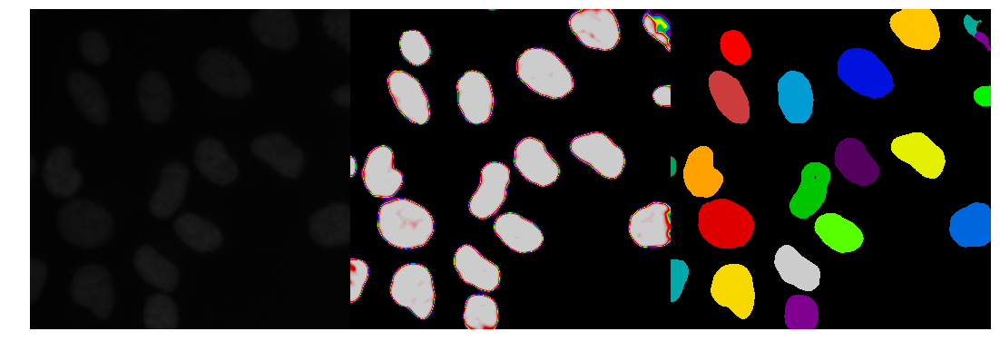

0.5721265059755565 0.7203952569953027


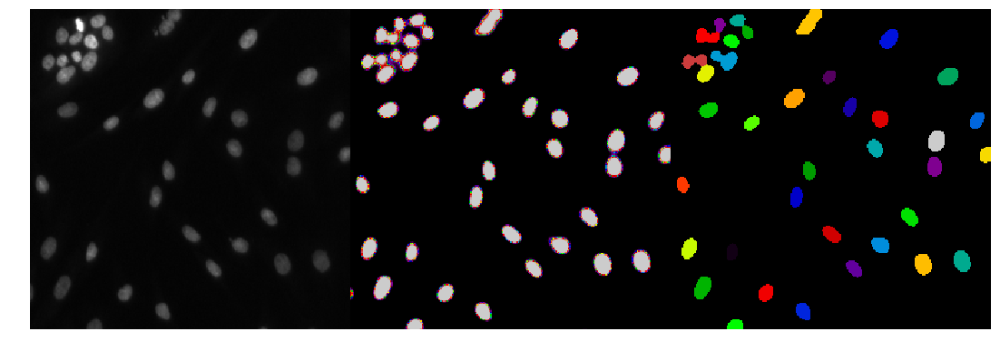

0.4785880785880785 0.6599434623934967


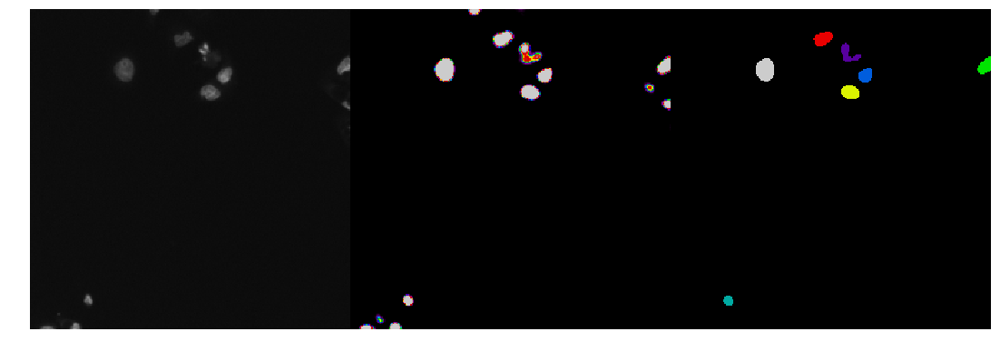

0.35970979177866075 0.5998967282705295


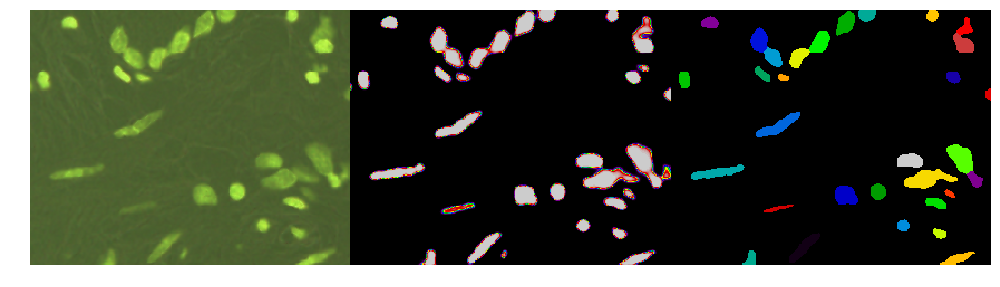

0.6143061026728628 0.6022982906709183


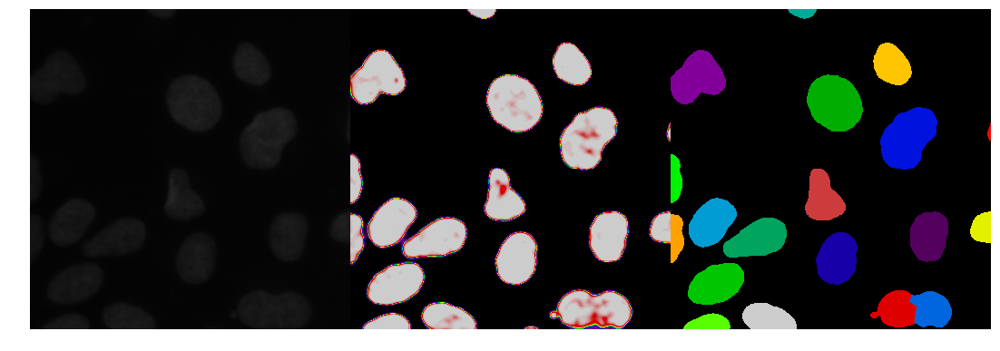

0.8375 0.6358985348607872


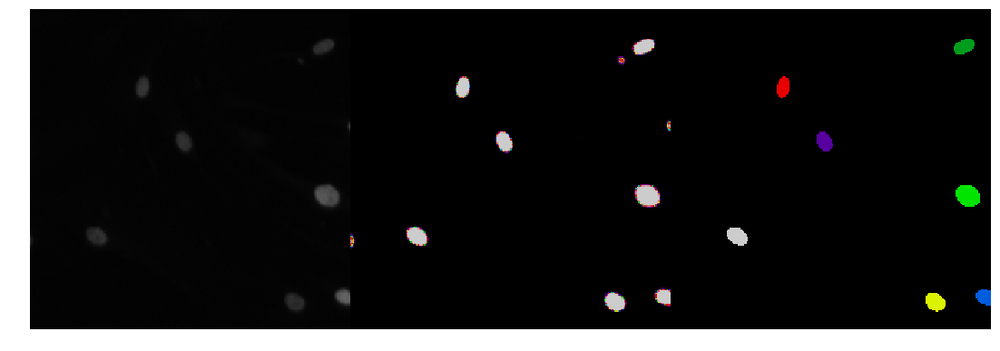

0.7951698461181219 0.6558074487679539


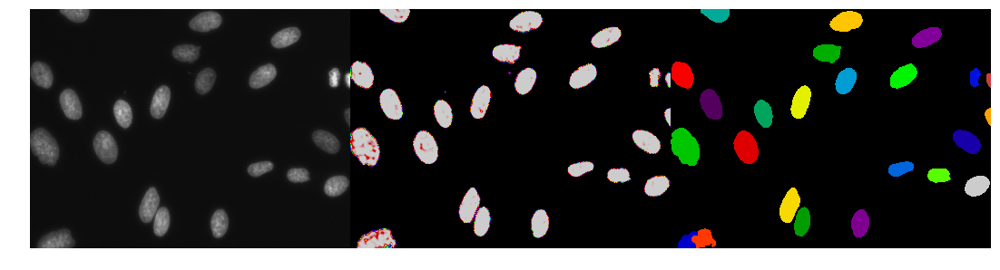

0.6294136026014671 0.6528747991938998


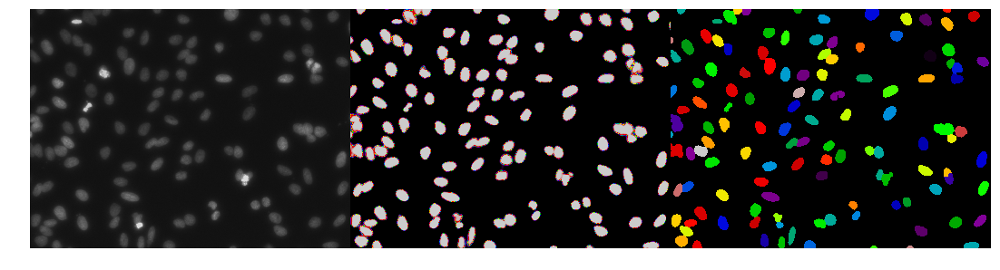

0.6312891649413389 0.6507162357686437


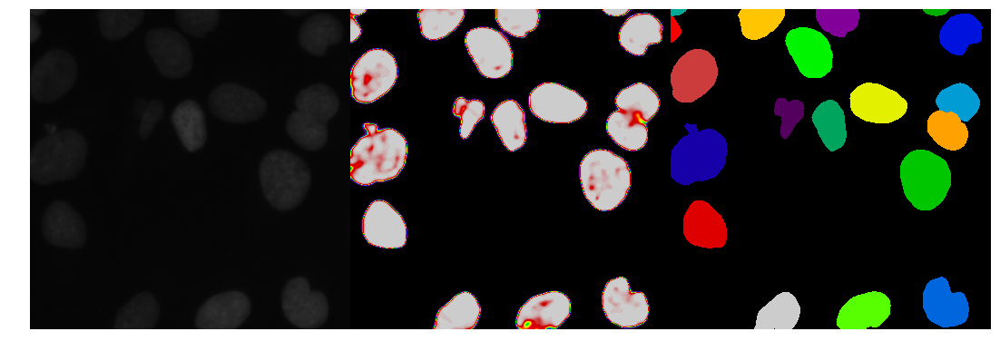

0.15854416010335748 0.6059733197990722


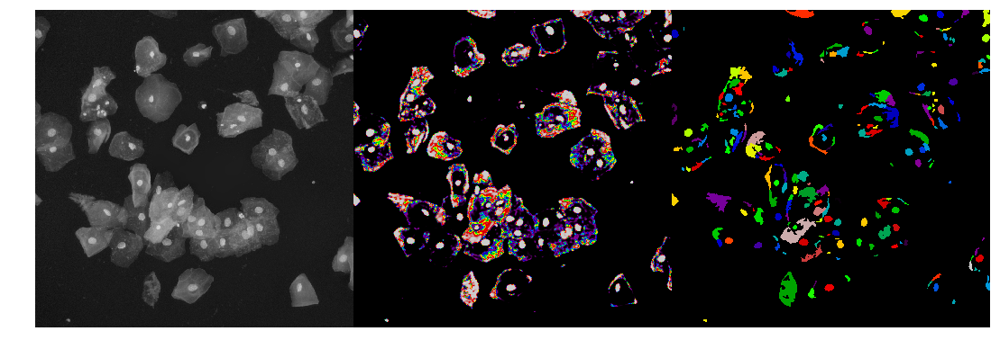

ValueError: Incompatible dimension for X and Y matrices: X.shape[1] == 767016 while Y.shape[1] == 765744

In [65]:
scores = []
for i, (img, pred) in enumerate(zip(val_images, val_predictions)):
    answer = watershed(pred,
        mask_threshold=0.7,
        width_holes=4,
        width_objects=3,
        sigma=4,
        padding_size=5,
        min_size=50,
        footprint=np.ones((3, 3)))
    scores.append(compute_eval_metric(val_labels[i], answer))
    print(scores[-1], np.mean(scores))
    draw.plots([img, pred, answer * 12367 % 1000])
    plt.show()

In [10]:
test_transform = transforms.DualCompose(
    [
        transforms.ImageOnly(transforms.Normalize())
    ]
)

test_predictions, test_names = predict.predict(model, test_images, test_ids, test_transform, 1)

HBox(children=(IntProgress(value=0, description='Predict', max=65), HTML(value='')))

In [22]:
import cv2
import numpy as np
import scipy.ndimage as nd
from skimage import img_as_bool, img_as_ubyte
from skimage import morphology
from skimage.feature import peak_local_max
from skimage.filters import gaussian
from tqdm import tqdm_notebook


def remove_smalls(mask, width_holes, width_objects):
    remove_holes = morphology.remove_small_holes(
        mask.astype(bool),
        min_size=width_holes ** 3
    )
    
    remove_objects = morphology.remove_small_objects(
        remove_holes.astype(bool),
        min_size=width_objects ** 3
    )
    return remove_holes, remove_objects


def distance_transform(mask, sigma):
    distance = nd.distance_transform_edt(mask)
    distance = gaussian(distance, sigma=sigma)
    return distance


def pad_zero(image, padding_size, padding=True):
    h, w = image.shape
    if padding:
        padded_image = np.zeros((h + 2 * padding_size, w + 2 * padding_size), dtype=image.dtype)
        padded_image[padding_size:padding_size + h, padding_size:padding_size + w] = image
        return padded_image
    else:
        return image[padding_size:-padding_size, padding_size:-padding_size]


def watershed(
        prediction,
        mask_threshold=0.7,
        center_threshold=0.7,
        width_holes=4,
        width_objects=3,
        sigma=3,
        padding_size=5,
        min_size=50,
        footprint=np.ones((3, 3))
):
    pred_mask = prediction
    mask = img_as_ubyte(pred_mask > mask_threshold)
    _, mask = remove_smalls(mask, width_holes, width_objects)
    
    padded_distance = pad_zero(distance_transform(mask, sigma=sigma), padding_size=padding_size)
    
    markers = nd.label(peak_local_max(
        padded_distance, indices=False,
        labels=pad_zero(mask, padding_size=padding_size),
        footprint=footprint
    ))[0]
    
    watershed_image = pad_zero(
        morphology.watershed(-pad_zero(pred_mask, padding_size=padding_size), 
        markers, mask=pad_zero(mask, padding_size=padding_size)),
        padding_size=padding_size, padding=False
    )
    
    unique, counts = np.unique(watershed_image, return_counts=True)
    for (k, v) in dict(zip(unique, counts)).items():
        if v < min_size:
            watershed_image[watershed_image == k] = 0
    return watershed_image


def get_labels(labeled_image):
    labels = []
    for i in np.unique(labeled_image):
        if i:
            mask = labeled_image == i
            labels.append(mask)
    return np.array(labels)

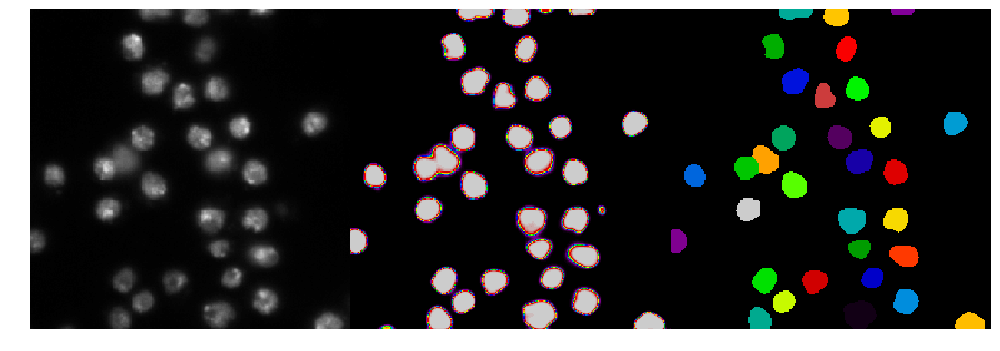

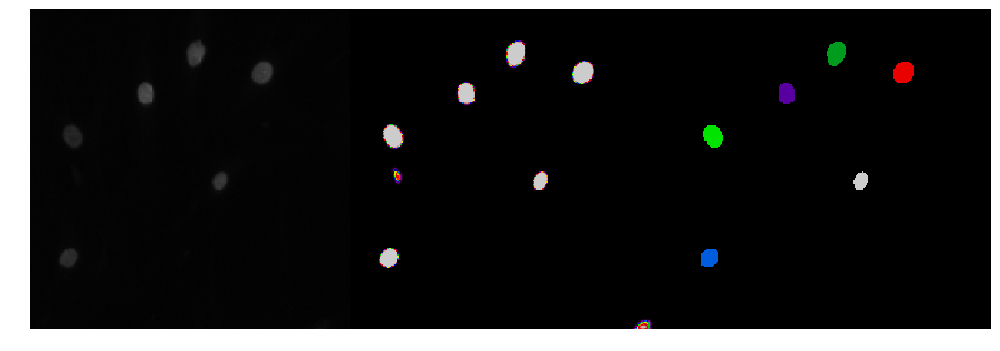

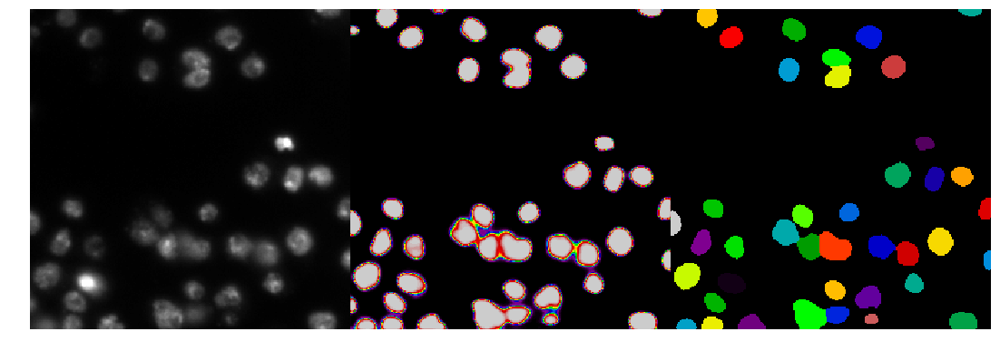

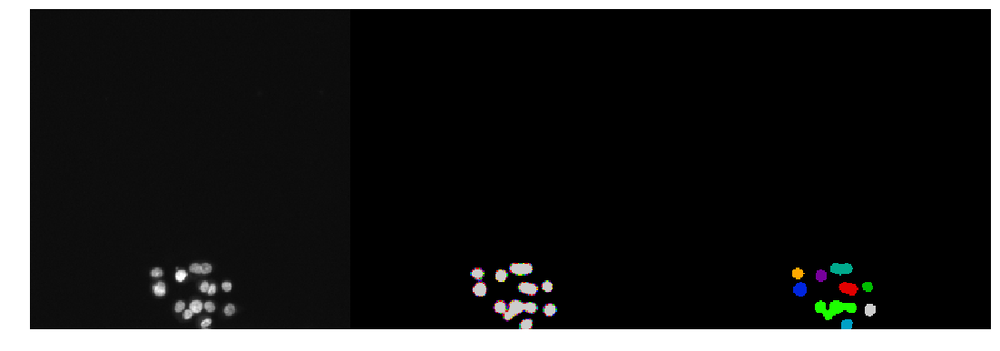

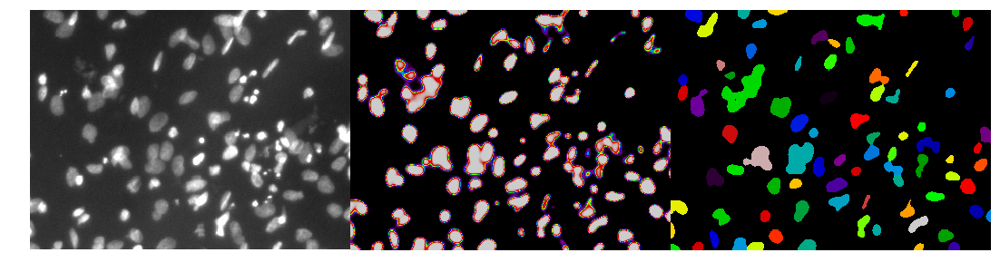

...

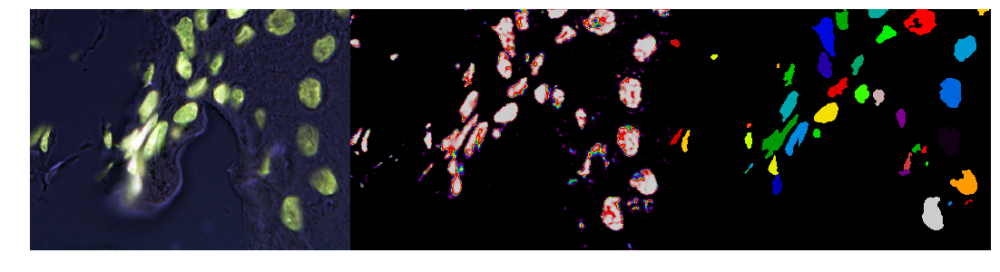

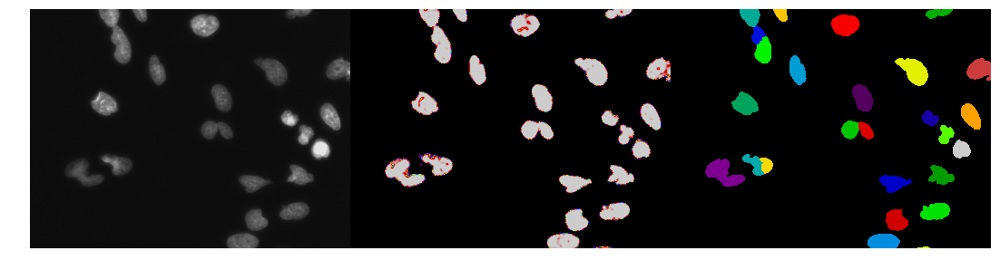

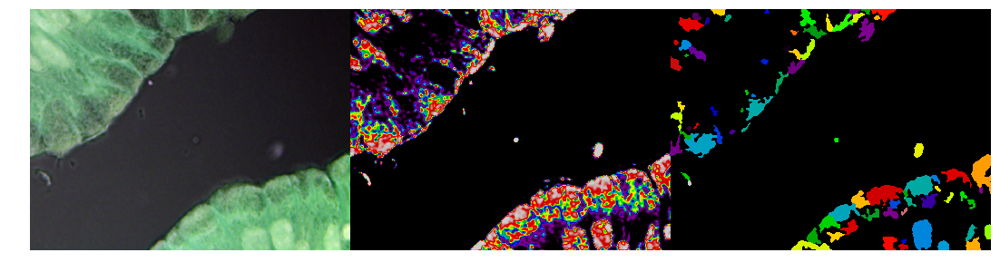

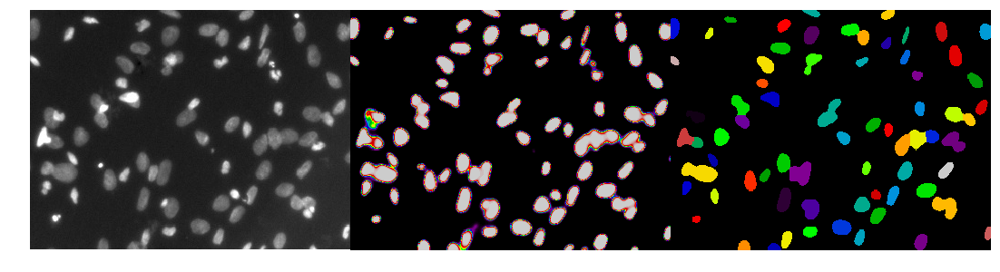

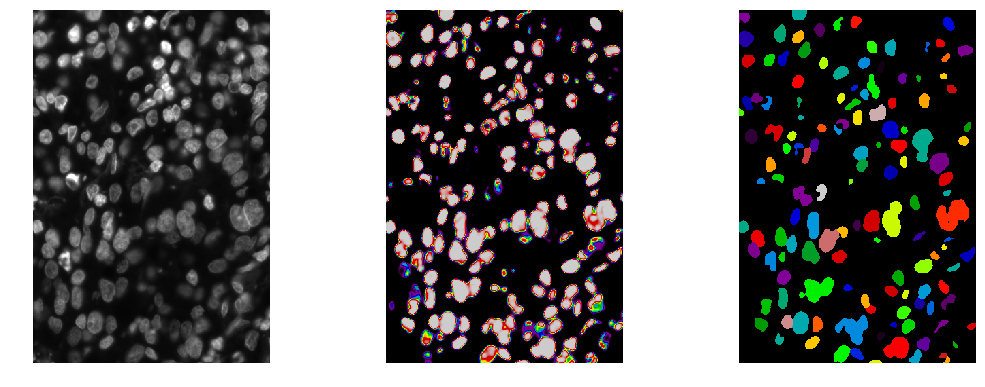

In [29]:
preds = []
for img, pred in zip(test_images, test_predictions):
    answer = watershed(np.squeeze(pred),
        mask_threshold=0.7,
        width_holes=4,
        width_objects=3,
        sigma=4,
        padding_size=5,
        min_size=50,
        footprint=np.ones((3, 3)))
    preds.append(answer)
    draw.plots([img, np.squeeze(pred), answer * 12367 % 1000])

In [30]:
new_ids, rles = mask2rle(test_predictions, test_names, lambda x: watershed(x,
        mask_threshold=0.8,
        width_holes=4,
        width_objects=3,
        sigma=3,
        padding_size=5,
        min_size=50,
        footprint=np.ones((3, 3))))

HBox(children=(IntProgress(value=0, max=65), HTML(value='')))

In [32]:
from datetime import datetime
sub = make_submission(
    '../subs/{}.csv'.format(datetime.now()), new_ids, rles
)